In [1]:
import pandas as pd
import random
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import cv2
from collections import Counter
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

2024-08-04 10:12:32.555700: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-04 10:12:32.555831: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-04 10:12:32.683015: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
filedr = '/kaggle/input/animal-images'

In [3]:
import os
files = os.listdir(filedr)
files

['omnivore', 'herbivore', 'carnivore']

In [4]:
images = []
diets = []
names = []
age_groups = []
diet_folders = os.listdir(filedr)
# Traverse through each diet folder
for diet in diet_folders:
    diet_path = os.path.join(filedr, diet)
    
    # Traverse through each animal folder in the diet folder
    for animal_name in os.listdir(diet_path):
        animal_path = os.path.join(diet_path, animal_name)
        
        # Check if it's a directory
        if os.path.isdir(animal_path):
            # Traverse through 'child' and 'adult' folders
            for age_group in ['child', 'adult']:
                age_group_path = os.path.join(animal_path, age_group)
                # Check if it's a directory
                if os.path.isdir(age_group_path):
                    # Traverse through each image in the age group folder
                    for image_name in os.listdir(age_group_path):
                        image_path = os.path.join(age_group_path, image_name)
                        try:
                            # Open and read the image
                            with Image.open(image_path) as img:
                                # Append image data to the list
                                img = img.resize((256,256))
                                img_array = np.array(img)
                                images.append(img_array)
                                # Append diet, name, and age group info to respective lists
                                diets.append(diet)
                                names.append(animal_name)
                                age_groups.append(age_group)
                        except Exception as e:
                            print(f"Error loading image {image_path}: {e}")

In [5]:
print(f"Total images: {len(images)}")
print(f"Total diets: {len(diets)}")
print(f"Total names: {len(names)}")
print(f"Total age_groups: {len(age_groups)}")

Total images: 1157
Total diets: 1157
Total names: 1157
Total age_groups: 1157


In [6]:
np.unique(diets)

array(['carnivore', 'herbivore', 'omnivore'], dtype='<U9')

In [7]:
np.unique(names)

array(['bear', 'chimpanzee', 'cow', 'crocodile', 'crow', 'deer', 'eagle',
       'elephant', 'giraffe', 'lion', 'pig', 'raccoon', 'tiger', 'wolf',
       'zebra'], dtype='<U10')

In [8]:
np.unique(age_groups)

array(['adult', 'child'], dtype='<U5')

In [9]:
type(images[0])

numpy.ndarray

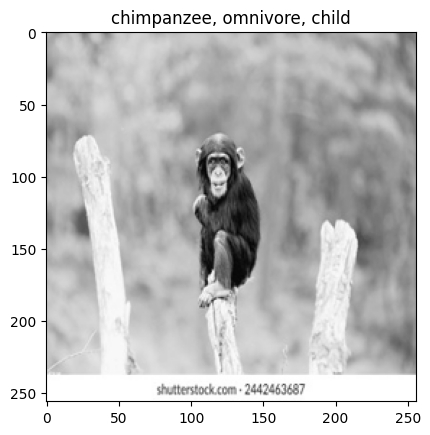

In [10]:
idx = 13
plt.imshow(images[idx])
plt.title(f'{names[idx]}, {diets[idx]}, {age_groups[idx]}')
plt.show()

In [11]:
shapes = [img.shape for img in images]
unique_shapes = set(shapes)
print("Unique shapes found in images:", unique_shapes)

Unique shapes found in images: {(256, 256, 4), (256, 256), (256, 256, 3)}


In [12]:
indices_to_remove = [i for i, img in enumerate(images) 
                     if (img.shape in [(256, 256),(256, 256,4)])]
len(indices_to_remove)
# Remove images and corresponding labels
images_filtered = [img for i, img in enumerate(images) if i not in indices_to_remove]
diets_filtered = [label for i, label in enumerate(diets) if i not in indices_to_remove]
names_filtered = [label for i, label in enumerate(names) if i not in indices_to_remove]
age_groups_filtered = [label for i, label in enumerate(age_groups) if i not in indices_to_remove]

In [13]:
shapes = [img.shape for img in images_filtered]
unique_shapes = set(shapes)
print("Unique shapes found in images:", unique_shapes)

Unique shapes found in images: {(256, 256, 3)}


In [14]:
print(f"Total images: {len(images_filtered)}")
print(f"Total diets: {len(diets_filtered)}")
print(f"Total names: {len(names_filtered)}")
print(f"Total age_groups: {len(age_groups_filtered)}")

Total images: 1152
Total diets: 1152
Total names: 1152
Total age_groups: 1152


In [15]:
def display_random_images(images, diets, age_groups, names, num_images=3):
    num_cols = 3  # Number of columns for subplots (adjust as needed)
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate number of rows needed
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

    for i in range(num_images):
        row = i//num_cols
        col = i % num_cols
        # Select a random index
        random_index = random.randint(0, len(images) - 1)
        image = images[random_index]
        diet = diets[random_index]
        age_group = age_groups[random_index]
        name = names[random_index]

        # Load and display the image
        axs[row, col].imshow(image)
        axs[row, col].set_title(f'name: {name}, age group: {age_group}, diet: {diet}')
        axs[row, col].axis('off')
        
    for i in range(num_images, num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        axs[row, col].axis('off')
        
    plt.tight_layout()
    plt.show()

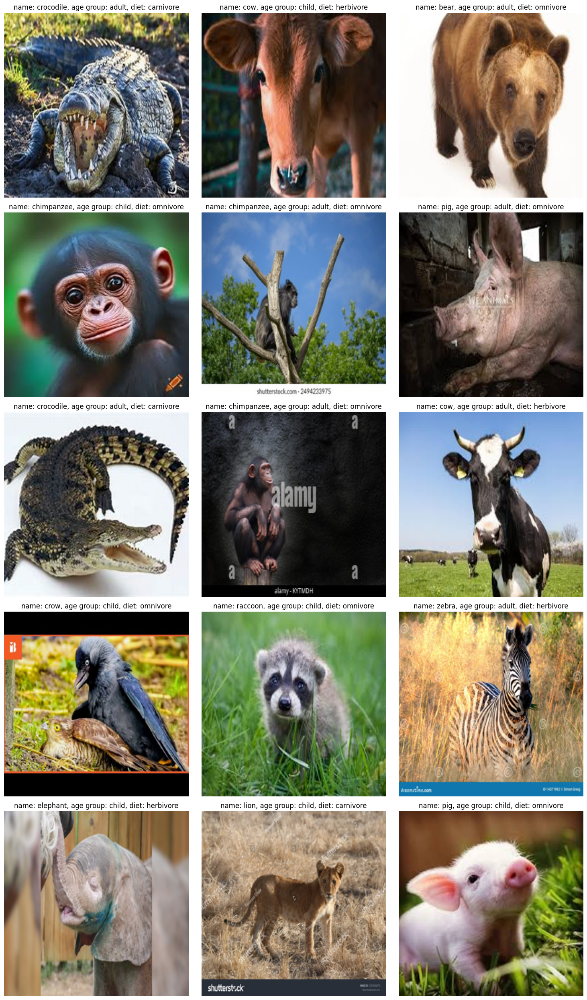

In [16]:
display_random_images(images_filtered,diets_filtered, age_groups_filtered, names_filtered, 15)

In [17]:
diets_count = dict(Counter(diets_filtered))
diets_count

{'omnivore': 395, 'herbivore': 381, 'carnivore': 376}

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


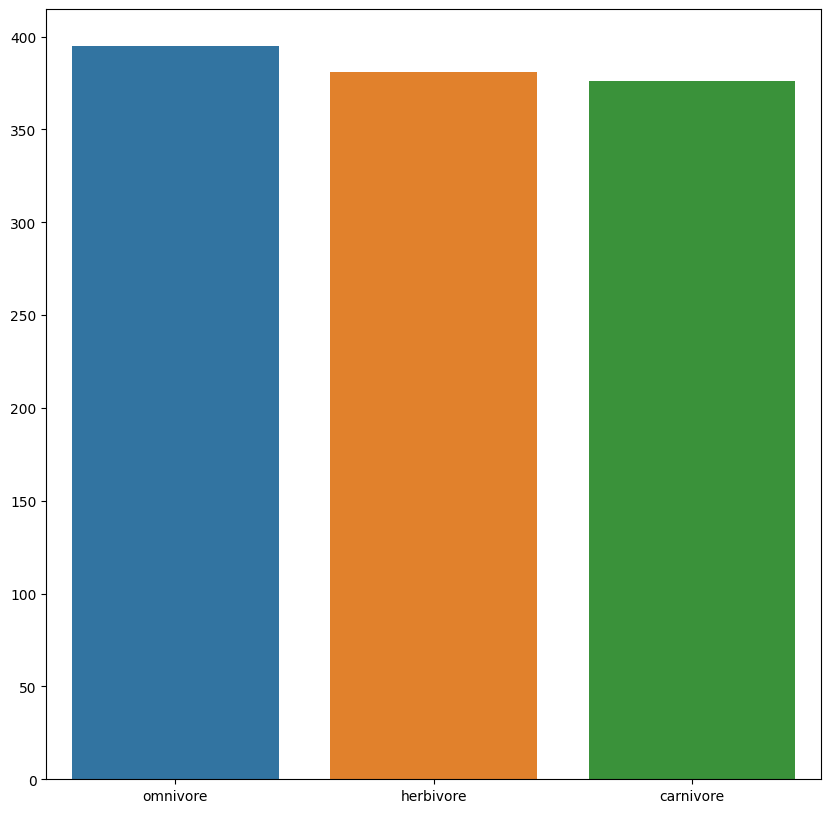

In [18]:
plt.figure(figsize=(10,10))
sns.barplot(x=list(diets_count.keys()), y=list(diets_count.values()))
plt.show()

In [19]:
names_count = dict(Counter(names_filtered))
names_count

{'chimpanzee': 76,
 'raccoon': 75,
 'bear': 74,
 'pig': 76,
 'crow': 94,
 'elephant': 74,
 'zebra': 77,
 'cow': 84,
 'giraffe': 68,
 'deer': 78,
 'wolf': 63,
 'eagle': 68,
 'lion': 84,
 'tiger': 96,
 'crocodile': 65}

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


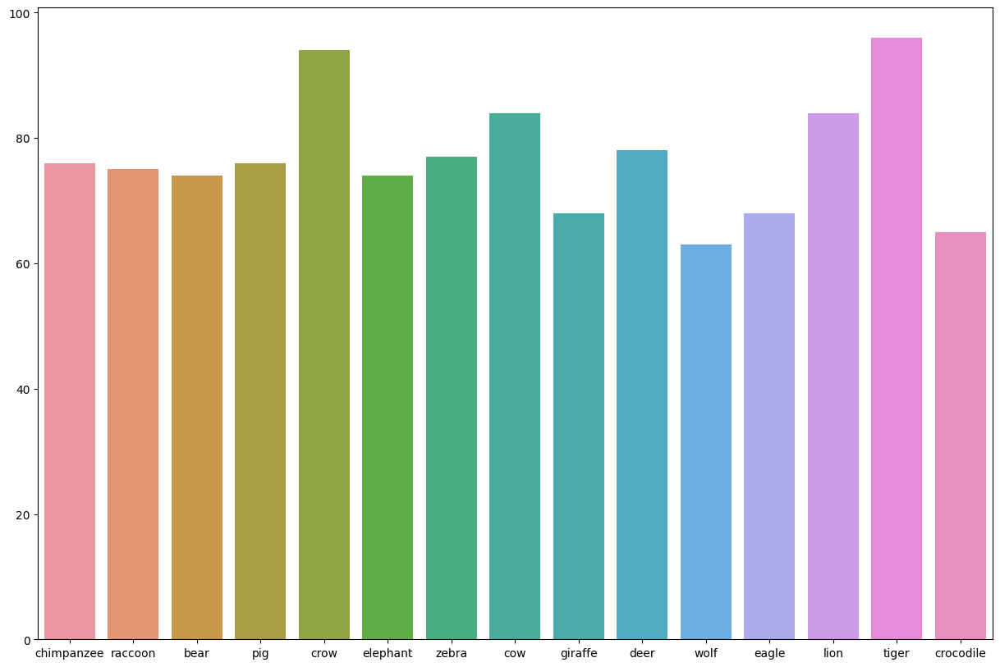

In [20]:
plt.figure(figsize=(15,10))
sns.barplot(x=list(names_count.keys()), y=list(names_count.values()))
plt.show()

In [21]:
age_groups_count = dict(Counter(age_groups_filtered))
age_groups_count

{'child': 566, 'adult': 586}

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


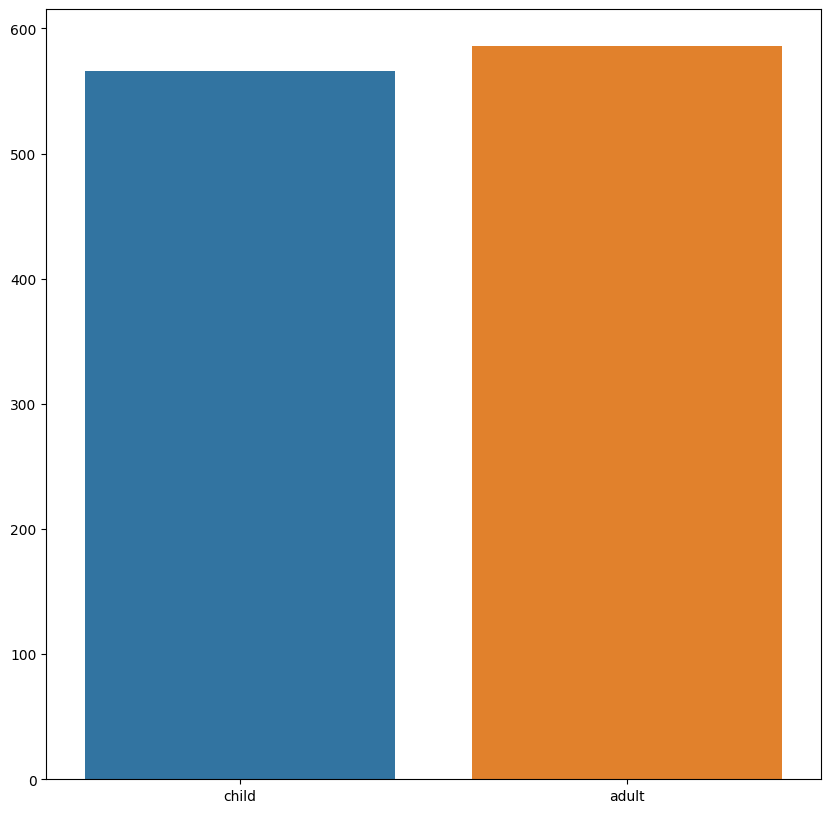

In [22]:
plt.figure(figsize=(10,10))
sns.barplot(x=list(age_groups_count.keys()), y=list(age_groups_count.values()))
plt.show()

In [23]:
datagen = ImageDataGenerator(
    rotation_range=30,            
    width_shift_range=0.2,        
    height_shift_range=0.2,       
    horizontal_flip=True,     
    zoom_range=0.2,
    shear_range=0.2,
    fill_mode='nearest'
)

# Convert images to NumPy arrays after augmentation
images_augmented = []
for image in images_filtered:
    augmented_image = datagen.random_transform(image)
    images_augmented.append(augmented_image)

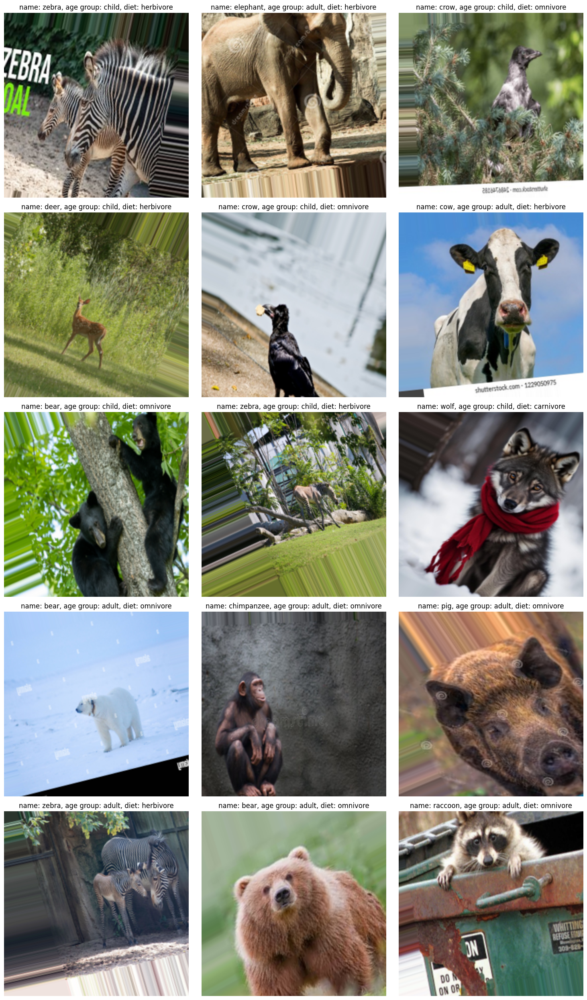

In [24]:
display_random_images(images_augmented,diets_filtered, age_groups_filtered, names_filtered, 15)

In [25]:
len(images_augmented)

1152

In [26]:
images_combined = images_filtered + images_augmented
diets_combined = diets_filtered + diets_filtered
names_combined = names_filtered + names_filtered
age_groups_combined = age_groups_filtered + age_groups_filtered

In [27]:
label_encoder = LabelEncoder()

In [28]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder_diets = LabelEncoder()
label_encoder_names = LabelEncoder()
label_encoder_age_groups = LabelEncoder()

# Fit and transform each list
diets_encoded = label_encoder_diets.fit_transform(diets_combined)
names_encoded = label_encoder_names.fit_transform(names_combined)
age_groups_encoded = label_encoder_age_groups.fit_transform(age_groups_combined)

In [29]:
# Display label mappings
print("Diets mapping:", dict(zip(label_encoder_diets.classes_, label_encoder_diets.transform(label_encoder_diets.classes_))))
print("Names mapping:", dict(zip(label_encoder_names.classes_, label_encoder_names.transform(label_encoder_names.classes_))))
print("Age groups mapping:", dict(zip(label_encoder_age_groups.classes_, label_encoder_age_groups.transform(label_encoder_age_groups.classes_))))

Diets mapping: {'carnivore': 0, 'herbivore': 1, 'omnivore': 2}
Names mapping: {'bear': 0, 'chimpanzee': 1, 'cow': 2, 'crocodile': 3, 'crow': 4, 'deer': 5, 'eagle': 6, 'elephant': 7, 'giraffe': 8, 'lion': 9, 'pig': 10, 'raccoon': 11, 'tiger': 12, 'wolf': 13, 'zebra': 14}
Age groups mapping: {'adult': 0, 'child': 1}


In [30]:
animal_names = np.unique(names_filtered)
animal_names

array(['bear', 'chimpanzee', 'cow', 'crocodile', 'crow', 'deer', 'eagle',
       'elephant', 'giraffe', 'lion', 'pig', 'raccoon', 'tiger', 'wolf',
       'zebra'], dtype='<U10')

In [31]:
labels=[]
i=0
while i<len(diets_encoded):
    label=[]
    label.append(diets_encoded[i])
    label.append(names_encoded[i])
    label.append(age_groups_encoded[i])
    labels.append(label)
    i=i+1

In [32]:
labels[0]

[2, 1, 1]

In [33]:
labels_f = np.array(labels)

In [34]:
labels_f.shape

(2304, 3)

In [35]:
images_f = np.array(images_combined)
images_f = images_f/255
images_f.shape

(2304, 256, 256, 3)

In [36]:
# Split data into training and remaining (validation + test)
X_train, X_remaining, y_train, y_remaining = train_test_split(images_f, labels_f, test_size=0.3, random_state=42)

# Split remaining data into validation and test
X_val, X_test, y_val, y_test = train_test_split(X_remaining, y_remaining, test_size=0.5, random_state=42)

In [37]:
X_train.shape, y_train.shape

((1612, 256, 256, 3), (1612, 3))

In [38]:
X_test.shape, X_val.shape

((346, 256, 256, 3), (346, 256, 256, 3))

In [39]:
y_train_2 = [y_train[:, 0], y_train[:, 1], y_train[:, 2]]
y_test_2 = [y_test[:, 0], y_test[:, 1], y_test[:, 2]]
y_val_2 = [y_val[:, 0], y_val[:, 1], y_val[:, 2]]

In [40]:
from tensorflow.keras.regularizers import l1_l2

In [41]:
def create_model(input_shape, num_diets, num_names, num_age_groups):
    inputs = Input(shape=input_shape)

    conv_1 = Conv2D(32, (3, 3), padding='same', kernel_regularizer=l2(0.001))(inputs)
    bn_1 = BatchNormalization()(conv_1)
    act_1 = Activation('relu')(bn_1)
    maxp_1 = MaxPooling2D(pool_size=(2, 2))(act_1)
    drop_conv_1 = Dropout(0.3)(maxp_1)  # Added dropout

    conv_2 = Conv2D(64, (3, 3), padding='same', kernel_regularizer=l2(0.001))(drop_conv_1)
    bn_2 = BatchNormalization()(conv_2)
    act_2 = Activation('relu')(bn_2)
    maxp_2 = MaxPooling2D(pool_size=(2, 2))(act_2)

    conv_3 = Conv2D(128, (3, 3), padding='same', kernel_regularizer=l2(0.001))(maxp_2)
    bn_3 = BatchNormalization()(conv_3)
    act_3 = Activation('relu')(bn_3)
    maxp_3 = MaxPooling2D(pool_size=(2, 2))(act_3)

    conv_4 = Conv2D(128, (3, 3), padding='same', kernel_regularizer=l2(0.001))(maxp_3)
    bn_4 = BatchNormalization()(conv_4)
    act_4 = Activation('relu')(bn_4)
    maxp_4 = MaxPooling2D(pool_size=(2, 2))(act_4)

    flatten = Flatten()(maxp_4)

    dense_1 = Dense(128, kernel_regularizer=l2(0.001))(flatten)
    bn_dense_1 = BatchNormalization()(dense_1)
    act_dense_1 = Activation('relu')(bn_dense_1)
    drop_1 = Dropout(0.6)(act_dense_1)

    dense_2 = Dense(64, kernel_regularizer=l2(0.001))(drop_1)
    bn_dense_2 = BatchNormalization()(dense_2)
    act_dense_2 = Activation('relu')(bn_dense_2)
    drop_2 = Dropout(0.6)(act_dense_2)


    # Output layers
    diet_out = Dense(num_diets, activation='softmax', name='diet_out')(drop_2)
    name_out = Dense(num_names, activation='softmax', name='name_out')(drop_2)
    age_group_out = Dense(num_age_groups, activation='softmax', name='age_group_out')(drop_2)


    model = Model(inputs=inputs, outputs=[diet_out, name_out, age_group_out])

    model.compile(
        loss={'diet_out': 'sparse_categorical_crossentropy',
              'name_out': 'sparse_categorical_crossentropy',
              'age_group_out': 'sparse_categorical_crossentropy'},
        optimizer=Adam(learning_rate=0.0007),
        metrics={'diet_out': 'accuracy',
                 'name_out': 'accuracy',
                 'age_group_out': 'accuracy'}
    )

    return model

In [42]:
num_diets = len(np.unique(diets_combined))
num_names = len(np.unique(names_combined))
num_age_groups = len(np.unique(age_groups_combined))

In [43]:
model=create_model((256,256,3), num_diets, num_names, num_age_groups)

In [44]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128, 128,  │          0 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     18,496 │ dropout[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 32,    │    147,584 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 32, 32,    │          0 │ batch_normalizat

 Total params: 4,446,996 (16.96 MB)

 Trainable params: 4,445,908 (16.96 MB)

 Non-trainable params: 1,088 (4.25 KB)

In [45]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf
fle_s='Animal_Recognizer.keras'
checkpoint=ModelCheckpoint(fle_s,monitor='val_loss',verbose=1,save_best_only=True,save_weights_only=False, mode="auto",save_freq='epoch')
Early_stop=tf.keras.callbacks.EarlyStopping(patience=10,monitor='val_loss',restore_best_weights='True')
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5)
callback_list=[checkpoint,Early_stop, lr_scheduler]

In [46]:
print("X_train shape:", X_train.shape)
print("y_train_2 shapes:", [label.shape for label in y_train_2])
print("X_val shape:", X_val.shape)
print("y_val_2 shapes:", [label.shape for label in y_val_2])


X_train shape: (1612, 256, 256, 3)
y_train_2 shapes: [(1612,), (1612,), (1612,)]
X_val shape: (346, 256, 256, 3)
y_val_2 shapes: [(346,), (346,), (346,)]


In [47]:
history = model.fit(
    X_train, 
    [y_train_2[0], y_train_2[1], y_train_2[2]],  # Labels for each output
    validation_data=(X_val, [y_val_2[0], y_val_2[1], y_val_2[2]]),
    epochs=50,
    callbacks=callback_list,
    batch_size=16
)

Epoch 1/50


2024-08-04 10:14:03.364749: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.1309, expected 2.65729
2024-08-04 10:14:03.364934: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 27392: 3.36129, expected 2.88768
2024-08-04 10:14:03.364987: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 38656: 3.56606, expected 3.09244
2024-08-04 10:14:03.365638: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 131072: 2.58553, expected 1.63582
2024-08-04 10:14:03.365677: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 131073: 3.91803, expected 2.96832
2024-08-04 10:14:03.365686: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 131074: 2.80043, expected 1.85073
2024-08-04 10:14:03.365694: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 131075: 4.68346, expected 3.73375
2024-08-04 10:14:03.365702: 

  5/101 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - age_group_out_accuracy: 0.3575 - diet_out_accuracy: 0.2635 - loss: 7.7574 - name_out_accuracy: 0.0056    

I0000 00:00:1722766460.469036      71 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1722766460.493608      71 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 99/101 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - age_group_out_accuracy: 0.4843 - diet_out_accuracy: 0.3320 - loss: 6.9451 - name_out_accuracy: 0.0587

2024-08-04 10:14:26.116762: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.6476, expected 2.72011
2024-08-04 10:14:26.116830: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 3.96832, expected 3.04084
2024-08-04 10:14:26.116840: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 5.00374, expected 4.07625
2024-08-04 10:14:26.116848: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.4973, expected 4.56981
2024-08-04 10:14:26.116855: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.1816, expected 4.25411
2024-08-04 10:14:26.116863: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.73813, expected 4.81064
2024-08-04 10:14:26.116871: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.68741, expected 4.75992
2024-08-04 10:14:26.116879: E external/local_xla/xla/servi

101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - age_group_out_accuracy: 0.4846 - diet_out_accuracy: 0.3324 - loss: 6.9395 - name_out_accuracy: 0.0590

W0000 00:00:1722766479.571674      72 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
2024-08-04 10:14:40.085233: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 3.75186, expected 2.7595
2024-08-04 10:14:40.085303: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 5.03154, expected 4.03918
2024-08-04 10:14:40.085318: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 5.05879, expected 4.06643
2024-08-04 10:14:40.085331: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 6.33657, expected 5.34421
2024-08-04 10:14:40.085343: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 7.00113, expected 6.00877
2024-08-04 10:14:40.085356: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65541: 6.49388, expected 5.50152
2024-08-04 10:14:40.085367: E external/loc


Epoch 1: val_loss improved from inf to 5.39416, saving model to Animal_Recognizer.keras
101/101 ━━━━━━━━━━━━━━━━━━━━ 47s 216ms/step - age_group_out_accuracy: 0.4847 - diet_out_accuracy: 0.3326 - loss: 6.9368 - name_out_accuracy: 0.0591 - val_age_group_out_accuracy: 0.4827 - val_diet_out_accuracy: 0.3353 - val_loss: 5.3942 - val_name_out_accuracy: 0.0723 - learning_rate: 7.0000e-04
Epoch 2/50
 99/101 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - age_group_out_accuracy: 0.4859 - diet_out_accuracy: 0.3785 - loss: 6.0690 - name_out_accuracy: 0.0979
Epoch 2: val_loss improved from 5.39416 to 5.22657, saving model to Animal_Recognizer.keras
101/101 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - age_group_out_accuracy: 0.4861 - diet_out_accuracy: 0.3788 - loss: 6.0681 - name_out_accuracy: 0.0979 - val_age_group_out_accuracy: 0.4827 - val_diet_out_accuracy: 0.3699 - val_loss: 5.2266 - val_name_out_accuracy: 0.0925 - learning_rate: 7.0000e-04
Epoch 3/50
 99/101 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - age_group_out_acc

In [48]:
model.evaluate(X_test,y_test_2)

2024-08-04 10:17:20.492400: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 2.99935, expected 2.28267
2024-08-04 10:17:20.492477: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.17207, expected 3.45539
2024-08-04 10:17:20.492489: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.3619, expected 3.64522
2024-08-04 10:17:20.492503: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.47131, expected 4.75463
2024-08-04 10:17:20.492516: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.50046, expected 4.78378
2024-08-04 10:17:20.492527: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.73262, expected 5.01594
2024-08-04 10:17:20.492537: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 4.78622, expected 4.06954
2024-08-04 10:17:20.492548: E external/local_xla/xla/ser

10/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - age_group_out_accuracy: 0.6120 - diet_out_accuracy: 0.6392 - loss: 4.0627 - name_out_accuracy: 0.3581

2024-08-04 10:17:24.307511: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.46417, expected 2.70475
2024-08-04 10:17:24.307576: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 3.84459, expected 3.08517
2024-08-04 10:17:24.307585: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.95173, expected 4.19231
2024-08-04 10:17:24.307593: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.41186, expected 5.65244
2024-08-04 10:17:24.307601: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.90588, expected 5.14646
2024-08-04 10:17:24.307608: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.80195, expected 5.04253
2024-08-04 10:17:24.307616: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.57052, expected 5.8111
2024-08-04 10:17:24.307624: E external/local_xla/xla/ser

11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 328ms/step - age_group_out_accuracy: 0.6078 - diet_out_accuracy: 0.6401 - loss: 4.0484 - name_out_accuracy: 0.3606


[3.977163791656494, 0.586705207824707, 0.6445086598396301, 0.37283235788345337]

In [49]:
pred=model.predict(X_test)

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step


In [50]:
pred[1]

array([[0.01014724, 0.00912185, 0.0195097 , ..., 0.35446972, 0.0796457 ,
        0.07256915],
       [0.10042493, 0.07431705, 0.03251895, ..., 0.08045027, 0.05401575,
        0.05934484],
       [0.0527936 , 0.05947578, 0.10819487, ..., 0.03831691, 0.08815926,
        0.01371171],
       ...,
       [0.1434535 , 0.14914826, 0.05490069, ..., 0.00701626, 0.04131898,
        0.00282536],
       [0.00150392, 0.00249716, 0.00855079, ..., 0.77994674, 0.00660894,
        0.0294227 ],
       [0.10921427, 0.16513717, 0.02877507, ..., 0.0044903 , 0.06145691,
        0.00634336]], dtype=float32)

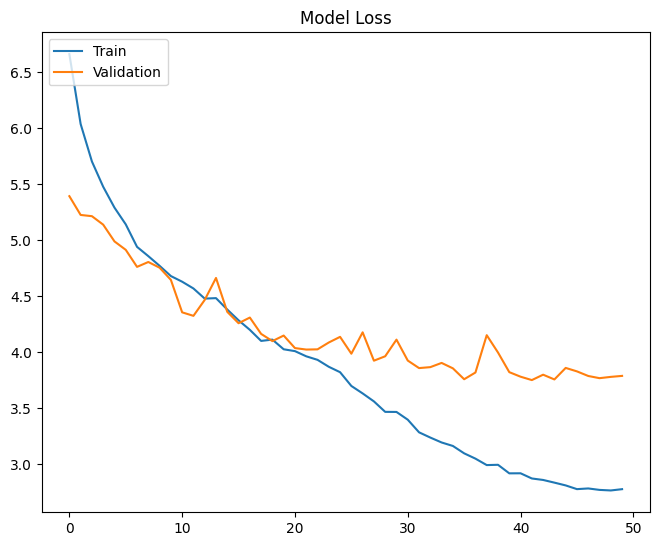

In [51]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel=('Epoch')
plt.ylabel=('Loss')
plt.legend(['Train','Validation'],loc='upper left')
plt.subplots_adjust(top=1.0,bottom=0.0,right=0.95,left=0,hspace=0.25,wspace=0.35)

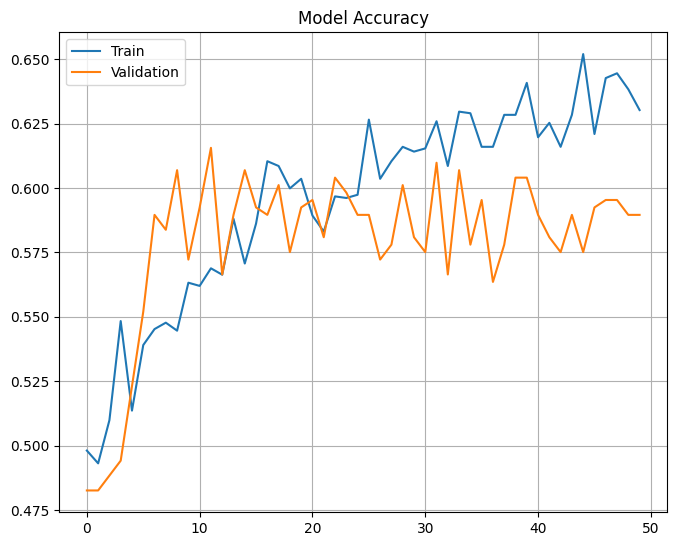

In [52]:
plt.plot(history.history['age_group_out_accuracy'])
plt.plot(history.history['val_age_group_out_accuracy'])
plt.title('Model Accuracy')
plt.xlabel=('Epoch')
plt.ylabel=('Accuracy')
plt.legend(['Train','Validation'],loc='upper left')
plt.subplots_adjust(top=1.0,bottom=0.0,right=0.95,left=0,hspace=0.25,wspace=0.35)
plt.grid()

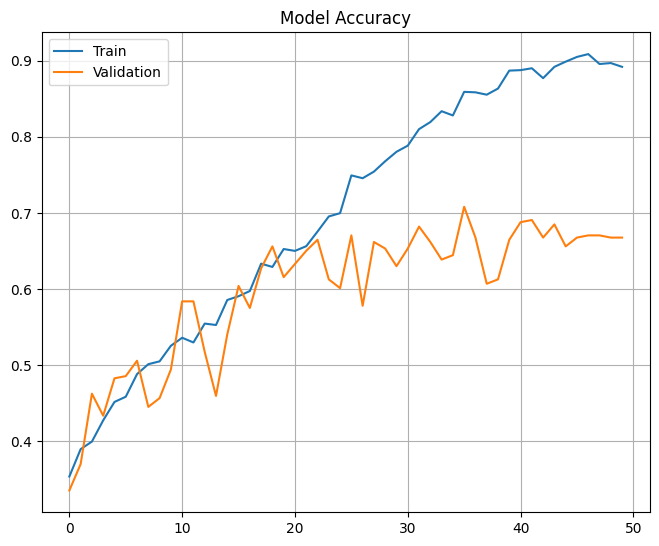

In [53]:
plt.plot(history.history['diet_out_accuracy'])
plt.plot(history.history['val_diet_out_accuracy'])
plt.title('Model Accuracy')
plt.xlabel=('Epoch')
plt.ylabel=('Accuracy')
plt.legend(['Train','Validation'],loc='upper left')
plt.subplots_adjust(top=1.0,bottom=0.0,right=0.95,left=0,hspace=0.25,wspace=0.35)
plt.grid()

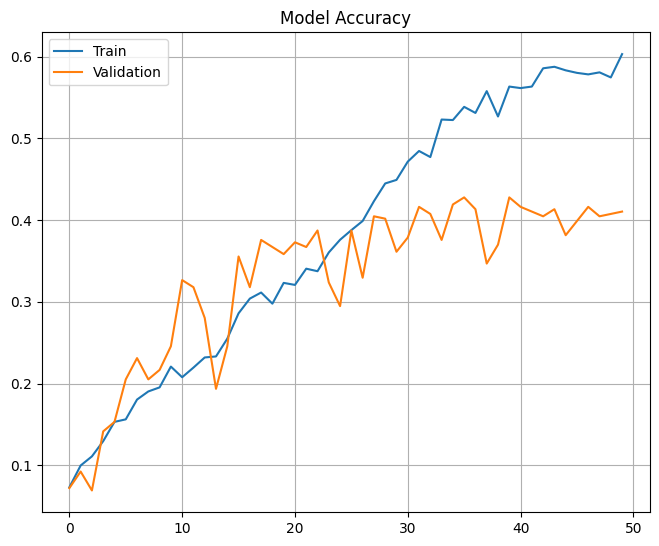

In [54]:
plt.plot(history.history['name_out_accuracy'])
plt.plot(history.history['val_name_out_accuracy'])
plt.title('Model Accuracy')
plt.xlabel=('Epoch')
plt.ylabel=('Accuracy')
plt.legend(['Train','Validation'],loc='upper left')
plt.subplots_adjust(top=1.0,bottom=0.0,right=0.95,left=0,hspace=0.25,wspace=0.35)
plt.grid()

In [55]:
Pred_l_diet = np.argmax(pred[0], axis=1)
Pred_l_diet

array([0, 0, 2, 2, 1, 2, 0, 2, 0, 1, 1, 0, 2, 1, 2, 1, 2, 2, 2, 2, 2, 0,
       2, 0, 2, 0, 0, 1, 0, 1, 2, 1, 1, 2, 2, 2, 0, 2, 2, 0, 1, 2, 1, 1,
       2, 0, 1, 2, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 2,
       2, 2, 2, 2, 2, 1, 0, 1, 1, 2, 2, 1, 1, 0, 1, 0, 2, 1, 1, 1, 1, 0,
       2, 0, 2, 2, 0, 0, 1, 2, 2, 2, 2, 0, 2, 1, 0, 2, 2, 2, 0, 1, 1, 2,
       0, 2, 2, 2, 0, 0, 0, 2, 1, 2, 0, 1, 2, 2, 2, 2, 2, 0, 1, 2, 0, 1,
       0, 2, 2, 2, 2, 0, 1, 1, 2, 2, 2, 1, 1, 0, 2, 0, 0, 2, 2, 2, 2, 2,
       2, 2, 0, 2, 2, 0, 1, 2, 2, 2, 1, 0, 2, 2, 2, 2, 2, 1, 0, 2, 2, 2,
       0, 0, 2, 2, 2, 1, 1, 2, 0, 1, 2, 1, 1, 1, 0, 1, 2, 1, 2, 1, 1, 2,
       0, 0, 0, 0, 1, 0, 2, 0, 2, 1, 0, 1, 2, 2, 2, 2, 1, 2, 0, 2, 2, 1,
       1, 2, 1, 1, 2, 0, 2, 2, 2, 2, 2, 2, 1, 0, 0, 1, 2, 1, 2, 2, 0, 0,
       2, 2, 0, 1, 1, 2, 2, 1, 0, 2, 1, 2, 1, 0, 2, 2, 0, 1, 2, 0, 1, 2,
       1, 1, 1, 1, 2, 1, 0, 1, 0, 1, 2, 2, 0, 0, 1, 2, 1, 2, 0, 2, 2, 2,
       0, 0, 2, 2, 0, 2, 0, 2, 2, 2, 2, 2, 0, 1, 1,

In [56]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [57]:
report_diet=classification_report(y_test_2[0], Pred_l_diet)
print(report_diet)

              precision    recall  f1-score   support

           0       0.73      0.57      0.64       115
           1       0.65      0.56      0.60       110
           2       0.59      0.79      0.68       121

    accuracy                           0.64       346
   macro avg       0.66      0.64      0.64       346
weighted avg       0.66      0.64      0.64       346



In [58]:
results_diet=confusion_matrix(y_test_2[0], Pred_l_diet)
print(results_diet)

[[65 18 32]
 [14 62 34]
 [10 15 96]]


<Axes: >

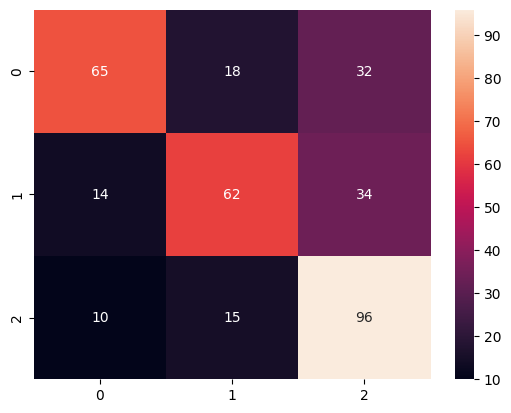

In [59]:
import seaborn as sns
sns.heatmap(results_diet,annot=True, fmt=".0f")

In [60]:
Pred_l_name = np.argmax(pred[1], axis=1)
Pred_l_name

array([12,  3,  9,  4,  2,  1, 12, 10,  2, 14,  5,  3, 10,  2, 11,  8,  0,
        4,  5, 11,  1,  3,  4, 12, 11, 12, 12,  5,  3, 12,  1,  7, 14, 10,
        4,  7,  9,  4,  1, 12,  7,  0, 10,  5, 10, 12,  2, 10,  9,  4,  3,
       10,  1,  5,  5, 13,  1,  1, 10,  2,  1,  4,  7,  3, 13,  1,  1, 13,
        1,  1,  1,  5, 11,  2, 14, 10,  4,  5,  7, 12,  2,  5,  0,  2, 14,
        2, 14,  9,  0,  9,  1,  1, 12, 12,  7, 11,  5,  4,  7, 12, 10,  8,
       12, 10,  1,  7,  2,  5,  2, 10, 12,  1,  4,  4,  3,  9, 13,  4,  7,
        1, 14,  7,  1,  1, 10, 11, 11,  9,  2,  4,  6, 14, 12,  4, 11,  1,
        1,  9,  5,  8,  1,  1, 10, 14,  5,  6,  5, 12, 12, 10,  1, 10, 11,
       10,  1,  4, 12,  1,  6,  9,  7,  4, 10,  4,  9,  9, 10,  5, 10, 11,
       11, 10,  9,  0,  1,  7,  9, 12,  1,  4,  1, 14,  5, 10,  6, 14,  4,
        7,  7,  5,  5,  5,  0,  5,  1,  7, 14,  1,  9, 12,  6, 12,  2, 12,
        4, 12,  1,  7,  9,  5,  1,  4, 11,  1,  5,  5, 12, 10,  5,  8,  5,
        2,  5,  7,  1,  9

In [61]:
report_name=classification_report(y_test_2[1],Pred_l_name)
print(report_name)

              precision    recall  f1-score   support

           0       0.14      0.04      0.07        23
           1       0.29      0.58      0.39        24
           2       0.26      0.18      0.21        28
           3       0.57      0.21      0.31        19
           4       0.25      0.29      0.27        28
           5       0.19      0.47      0.27        15
           6       0.31      0.16      0.21        25
           7       0.57      0.46      0.51        28
           8       0.50      0.31      0.38        13
           9       0.43      0.48      0.46        27
          10       0.31      0.52      0.39        21
          11       0.35      0.28      0.31        25
          12       0.56      0.68      0.61        28
          13       0.00      0.00      0.00        16
          14       0.76      0.73      0.75        26

    accuracy                           0.37       346
   macro avg       0.37      0.36      0.34       346
weighted avg       0.38   

In [62]:
results_name=confusion_matrix(y_test_2[1],Pred_l_name)
print(results_name)

[[ 1  2  1  0  5  5  0  1  0  0  5  3  0  0  0]
 [ 1 14  1  0  4  0  0  0  0  0  1  3  0  0  0]
 [ 0  3  5  0  2  3  0  3  0  5  7  0  0  0  0]
 [ 1  0  0  4  0  0  1  0  2  1  3  0  4  0  3]
 [ 1  5  2  0  8  0  4  3  0  1  1  1  1  1  0]
 [ 0  1  0  0  1  7  1  0  0  0  0  1  0  3  1]
 [ 2  3  1  0  4  0  4  1  0  1  2  5  1  1  0]
 [ 1  3  3  0  3  2  0 13  0  2  1  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  4  4  1  0  2  0  1]
 [ 0  3  2  0  0  4  0  0  0 13  0  0  4  1  0]
 [ 0  2  1  0  1  4  1  0  0  1 11  0  0  0  0]
 [ 0  7  0  2  2  3  0  1  0  0  2  7  0  1  0]
 [ 0  2  0  1  1  2  1  0  1  1  0  0 19  0  0]
 [ 0  3  2  0  0  4  1  1  0  1  2  0  1  0  1]
 [ 0  0  0  0  1  2  0  0  1  0  0  0  2  1 19]]


<Axes: >

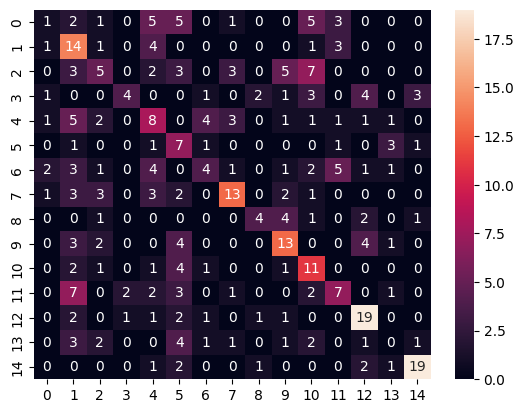

In [63]:
import seaborn as sns
sns.heatmap(results_name,annot=True, fmt=".0f")

In [64]:
Pred_l_age_group = np.argmax(pred[2], axis=1)
Pred_l_age_group

array([0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1,

In [65]:
report_age_group=classification_report(y_test_2[2],Pred_l_age_group)
print(report_age_group)

              precision    recall  f1-score   support

           0       0.62      0.52      0.57       181
           1       0.56      0.65      0.60       165

    accuracy                           0.59       346
   macro avg       0.59      0.59      0.59       346
weighted avg       0.59      0.59      0.59       346



In [66]:
results_age_group=confusion_matrix(y_test_2[2],Pred_l_age_group)
print(results_age_group)

[[ 95  86]
 [ 57 108]]


<Axes: >

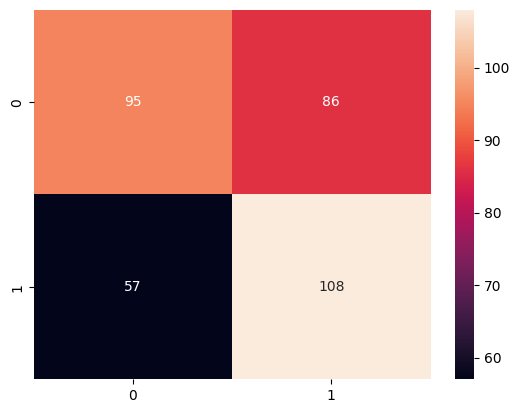

In [67]:
import seaborn as sns
sns.heatmap(results_age_group,annot=True, fmt=".0f")